# Understanding V-Structures and the Critical Role They Play in Causal Validation

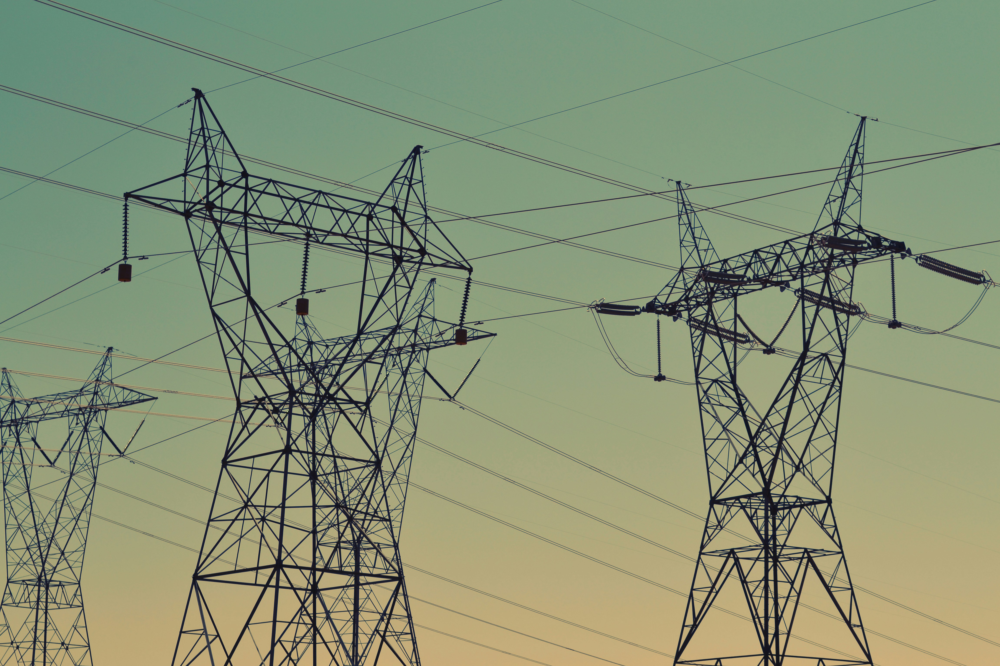
Photo by <a href="https://unsplash.com/@fresonneveld?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Fré Sonneveld</a> on <a href="https://unsplash.com/photos/black-transmission-towers-under-green-sky-q6n8nIrDQHE?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Unsplash</a>

In [66]:
import pandas as pd
import json
import matplotlib.pyplot as plt

from itertools import combinations

import sys
sys.path.insert(1, r'C:\\Users\\GHarr\\OneDrive - Lincoln College\\Python Projects\Data Science\\ghlibrary')

import dataframe_tools # type: ignore
from dag_tools import DirectedAcyclicGraph # type: ignore
from causal_tools import CausalModel # type: ignore

from icecream import ic

ic.disable()

## Introduction

Causal inference is an emerging field within machine learning that can move beyond predicting what could happen to explaining why it will happen and it doing so offers the promise of permanently resolving the underlying problem rather than dealing with the potential fallout.

To enable causal inference requires a visualisation of the cause-and-effect factors in a "Directed Acyclic Graph" or DAG which is typically developed by domain experts who have built up an informed view of the causality in a system.

A challenge with this approach is that the views of the domain experts can be flawed or biased and without an accurage DAG the causal models will be inaccurate and ineffective.

One specific problem within "causal validation" is detecting the direction of causality between two variables. For example it could be that studying for a management qualification "causes" promotion but it could be that newly promoted managers start a qualification to help develop their skills. In the real world if we can measure the timing that will help. For example if 90% of staff studied first and got promoted second the causality would become clear but all we had were the historical data indicating a correlation the direction of causality will not be clear.

### The Problem
Verifying the direction of causal links is difficult and on the dace of it looks impossible to do.

### The Opportunity
If an algorithm existed that could verify the direction of causal links it would add significant value causal inference by improving the accuracy of the DAG and hence the confidence in the predictions of causal models.

### The Way Forward
A specific type of junction within a DAG called V-structures can be used to indicate connections in a DAG which may be "reversed" i.e. pointing in the wrong direction.

In [2]:
# TODO: Don't forget Model Testing 10.ipynb in the main project!!!

## Getting Started

### Choosing a Directed Acyclic Graph

Let's start by choosing an entirely fictitious DAG that will be used through out the examples in the article. It is one of my favourites to work with because it is simple enough to use in testing but complex enough to contain all the variations that wil lbe found in more complex examples -

A complex DAG taken from 'Causal Inference in Statistics' that includes 5 colliders, 3 forks and a chain between the treatment and outcome


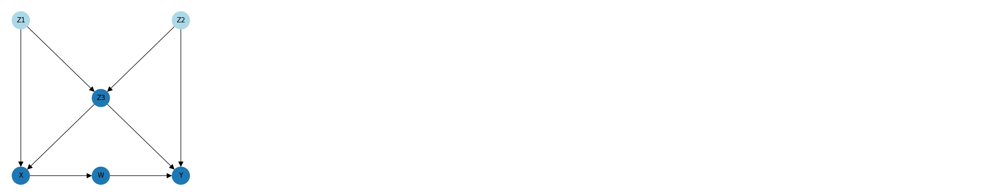

In [3]:
example_dag = DirectedAcyclicGraph.example_dags()["causal_inference_in_statistics_1"]
print(example_dag["description"])

dag = example_dag["dag"]

dag.draw(grid_size=5)

X is the treatment and Y is the outcome and the objective of causal inference is to ascertain the true and isolated effect of the treatment on the outcome independent of the effects of all the other variables.

It should be noted that in the real world X might represent taking a new drug, W might be the effect of the drug on blood pressure and Y might be the improvement in patient outcomes but for the purposes of the example I have just chosen letters.

### Generating the Test Data

In a real world example we would start with a set of data and the domain experts would use their expertise to produce a candidate DAG but in tests and examples the opposite is true. Firstly a DAG is selected based on its suitability to illustrate the examples and then a set of data is generated that fits the DAGs by randomly selecting weightings between each node and then creating data based on those weightings.

Here are the weightings selected to generate the data -

A complex DAG taken from 'Causal Inference in Statistics' that includes 5 colliders, 3 forks and a chain between the treatment and outcome


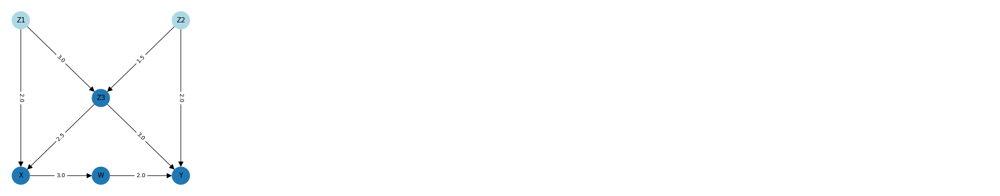

In [4]:
example_dag = DirectedAcyclicGraph.example_dags()["causal_inference_in_statistics_1"]
print(example_dag["description"])

dag = example_dag["dag"]

causal_model: CausalModel = CausalModel(dag=dag, random_state=1, allow_negative_coefficients=False)
causal_model.fit(X=None)
causal_model.data.head()

dag.draw(grid_size=5, labels=causal_model.edge_weightings)

In [5]:
causal_model.structural_equations

{'Z1': 'Z1 = np.random.normal(4.753198042323167, 1.720324493442158)',
 'Z2': 'Z2 = np.random.normal(3.289942920829799, 1.8849665188380633)',
 'Z3': 'Z3 = 3 x Z1 + 1.5 x Z2 + ε',
 'X': 'X = 2 x Z1 + 2.5 x Z3 + ε',
 'W': 'W = 3 x X + ε',
 'Y': 'Y = 2 x W + 2 x Z2 + 3 x Z3 + ε'}

That gives rise to the following set of structural equations, one equation for each node -

$$
Z1 \sim \mathcal{N}(4.75, 1.72^2) \\
Z2 \sim \mathcal{N}(3.29, 1.88^2) \\ 
$$

$$
Z3 = 3Z1 + 1.5Z2 + ε \\
X = 2Z1 + 2.5Z3 + ε \\
W = 3X + ε \\
Y = 2W + 2Z2 + 3Z3 + ε
$$

To complete the explanation all that is required is to understand the distinction between exogenous nodes / variables and endogenous variables / nodes. Exogenous nodes have no incoming causal arrows so in the example DAG the exogenous variables are Z1 and Z2 and the endogenous variables are X, W, Y and Z3. Exogenous variables must be assigned values randomly, usually by following a rule on a distribution.

The 6 structural equations (one for each node on the DAG) can therefore be fully explained and understood as follows ..

- Z1 is an exogenous variable (i.e. it has no inputs) that is normally distributed with a mean of 4.75 and a standard deviation of 1.72
- Z2 is an exogenous variable that is normally distributed with a mean of 3.29 and a standard deviation of 1.88

- Z3 = 3 X Z1 + 1.5 x Z2 + an error term
- X = 2 x Z1 + 2.5 x Z3 + an error term
- W = 3 x X + an error term
- Y = 2 x W + 2 x Z2 + 3 x Z3 + an error term

In [6]:
causal_model.data

,Z1,Z2,Z3,X,W,Y
0,3.844571,0.441614,14.082635,40.234675,125.152689,311.667199
1,2.907344,1.647342,9.650501,36.438910,119.387876,264.935335
2,6.241980,1.659767,21.327016,65.882887,230.060538,513.139115
3,0.793805,4.437415,7.917180,19.562641,51.027281,205.545929
4,7.754840,4.348612,29.910789,89.727765,269.565371,666.055405
...,...,...,...,...,...,...
995,4.633421,5.904063,23.170104,67.904617,212.178882,465.996645
996,5.361970,4.212665,21.861101,63.392878,184.950162,489.524639
997,4.431575,3.740065,20.950905,62.155688,205.315468,507.154223
998,4.489582,2.445267,15.724477,50.845614,140.986912,262.874028


## The Apparent Imposibility of Detecting the Direction of Causality

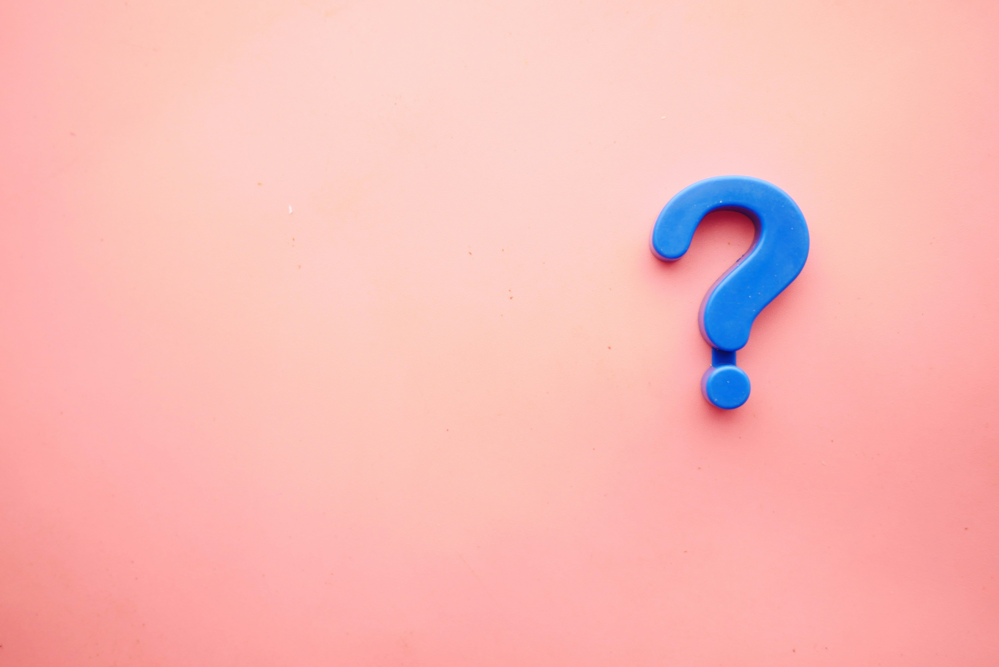
Photo by <a href="https://unsplash.com/@towfiqu999999?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Towfiqu barbhuiya</a> on <a href="https://unsplash.com/photos/a-blue-question-mark-on-a-pink-background-oZuBNC-6E2s?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Unsplash</a>

In a recent article I explored and explained the concept of paths through the DAG that are made up of junctions and if you are unfamiliar with these concepts this is essential reading to enable a full understanding of v-structures ...

https://medium.com/towards-data-science/understanding-junctions-chains-forks-and-colliders-and-the-role-they-play-in-causal-inference-211db6770e2f

That discussion included an exploration of "fork" junctions and how messages get through from the start to the end node. Consider the junction highlighted in the DAG below from X to Y through Z3 ...

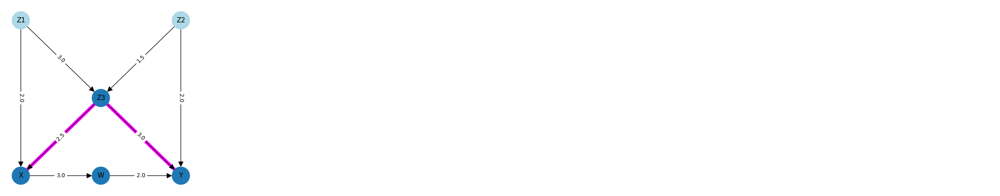

In [7]:
dag.draw_paths(paths=[dag.forks[1]], labels=causal_model.edge_weightings, cols=5)

Clearly "messages" can flow from Z3 to Y because Y = 3 x Z3 but the article on junctions explained that messages can also flow from X to Z3. 

This is because if X = 2.5 x Z3 it follows that Z3 = 1 / 2.5 x X dividing each side of the equation by 2.5 will resolve for X.

So if the relationship or multiplier between variables V1 and V2 is simply the inverse of the multiplier between V2 and V1 surely it is impossible to work out the direction if all we have is the data which always comes before the DAG in any real world causal problem?

This was my conclusion for a very long time. I had managed to work out some validation rules for identifying missing links and spurious links, but proving directionality of a link to identify links in the DAG which are in the wrong direction seemed impossible.

There are glimmers of solution in the literature using v-structures but they are faint and always incomplete. The remainder of this article aims to explore and combine those partial solutions to the point where an algorithm can be developed in Python to detect directional links in a DAG that are pointing in the wrong direction whe compared to the dataset the DAG is supposed to represent.

## A Basic Algorithm for Detecting the Direction of Causal Links

The article on junctions explained that a collider is a junction where the start and end nodes "point" to the intermediary (for example Z1 -> Z3 <- Z2 in the example DAG) and there is a special type of collider called a "v-structure" that can be defined as follows ...

A v-structure is a collider that is not adjacent (i.e. the start and end nodes are not connected in either direction).

Armed with this definition for v-structures an algorithm of identifying links that exist in the data, but that have been reversed (i.e. are shown in the wrong direction) in the DAG can be defined as follows ...

1. Iterate around all the edges in the DAG and for each edge ...
2. Create a new DAG by reversing the current edge.
3. If a v-structure has been created in the new DAG by reversing the edge and that v-structure exists in the data then the current DAG is wrong and the edge needs reversing.
4. If a v-structure has been destroyed in the current DAG and that v-structure does not exist in the data then the current DAG is wrong and the edge needs reversing.

All that is required to implement this algorithm is the ability to detect a v-structure in the data and that is where things start to get interesting ...

## Identifying V-Structures in the Data (Without Referring to the DAG)

Recalling that colliders are just junctions where the start and end nodes both point to the intermediary node it is easy to identify all of the colliders in the example DAG ...

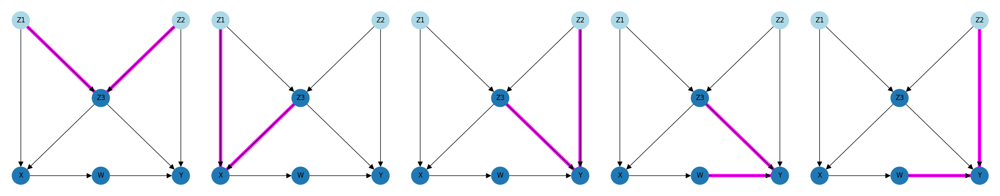

In [8]:
dag.draw_paths(paths=dag.colliders[::-1], cols=5)

Colliders have a special property in that in theory they can be detected in the data by carrying out an independence test and if a collider is found in the data that matches where the DAG says it should be then we have proved that part of the DAG is correct.

For a full explanation please refer to the previous article on junctions, but the essence of the proof is as follows ...

$$
% \perp is the ⊥ symbol, \!\!\! reverses 3 intervals and overlays another ⊥ giving ⫫
% \perp is ⊥ symbol then \!\!\!\!\!\! reverses 6 intervals, / is a sepeartor and finaly \ adds the slash giving ⫫̸
\providecommand{\independent}{\perp \!\!\! \perp}
\providecommand{\dependent}{\independent \!\!\!\!\!\! / \ }
\providecommand{\independentsingle}{\perp}
\providecommand{\dependentsingle}{\perp \!\!\!\!\!\! / \ }
\providecommand{\given}{\mid}
$$

$$
Z1 \independent _{_{G}} \ Z2 \Rightarrow Z1 \independent _{_{D}} \ Z2
$$

This statistical expression is looking at the final collider above and sating that if Z1 is independent of Z2 in the graph (DAG) this implies that Z1 is also independent of Z2 in the data and this can be tested.

The following python code carries out the dependence check and the full implementation details of the ``.dependence()`` dataframe extension method can be found in this article ...

https://medium.com/towards-data-science/demystifying-dependence-and-why-it-is-important-in-causal-inference-and-causal-validation-4263b18d5f04

In [9]:
data = causal_model.data

is_independent_on_unconditioned, _, ols_results = data.dependence(expression="Z1 ⫫ Z2")
is_independent_on_unconditioned

True

We can also test for independence using the ⫫̸ notation; the following test suggests that the relationship between X and Y is not a collider ...

In [10]:
is_dependent_on_unconditioned, _, ols_results = data.dependence(expression="X ⫫̸ Y")
is_dependent_on_unconditioned


True

... but this is not nearly as useful. The independence test ⫫ identifies a collider but the dependence test ⫫̸ only identifies that it is not a collider and cannot distinguish between chains and forks. 

This is why colliders are so useful, they can be identified (in theory) whereas chains and forks cannot, however before we charge into solving causal validation and directionality using colliders though there is more to understand.

The avaiable literature states that we should be using v-structures as the building blocks for this type of causal validation and not colliders which narrows down the set of junctions that will be tested against as follows ...

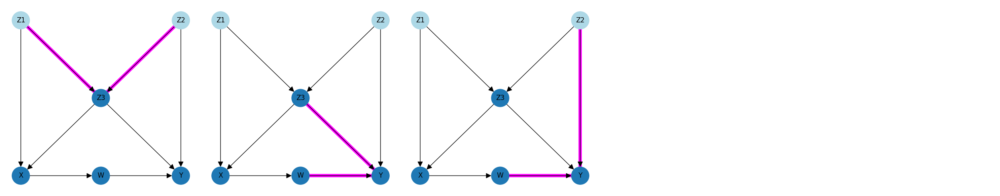

In [11]:
dag.draw_paths(paths=dag.v_structures()[::-1], cols=5)

The reason for using v-structures in causal validation is that they can be identified in the data with more accuracy and consistency but the reasons are not usually explained so it is worth understanding this distinction using an example. 

Consider this simple DAG that consists of just 3 nodes where the intermediary node is a collider ...

A simple collider DAG with a treatment and an outcome and a collider node inbetween


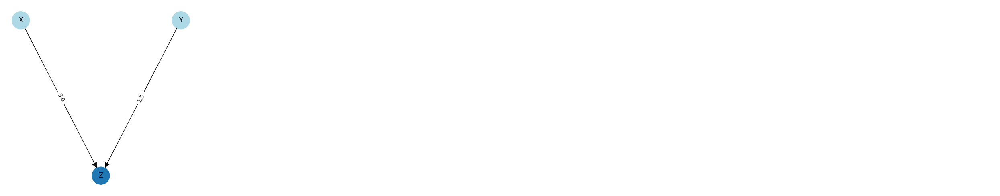

In [12]:
example_dag = DirectedAcyclicGraph.example_dags()["simple_collider"]
print(example_dag["description"])

collider_dag = example_dag["dag"]

collider_causal_model: CausalModel = CausalModel(dag=collider_dag, random_state=1, allow_negative_coefficients=False)
collider_causal_model.fit(X=None)
collider_causal_model.data.head()

collider_dag.draw(grid_size=5, labels=collider_causal_model.edge_weightings)

The data can be generated from the weightings in the same way as the main example above and the independence test will show that Y is independent of X ...

In [13]:
data = collider_causal_model.data

is_independent_on_unconditioned, _, ols_results = data.dependence(expression="Y ⫫ X")
is_independent_on_unconditioned

True

It also follows that this collider must be symmetrical so X should also be independent of Y in the data ...

In [14]:
data = collider_causal_model.data

is_independent_on_unconditioned, _, ols_results = data.dependence(expression="X ⫫ Y")
is_independent_on_unconditioned

True

But what happens if this collider structure becomes "adjacent" i.e. there is a direct link introduced between X and Y ...

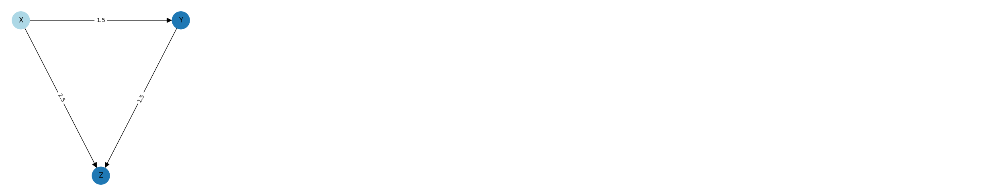

In [15]:
adjacent_collider_dag = collider_dag.add_edges([("X", "Y")])

adjacent_collider_causal_model: CausalModel = CausalModel(dag=adjacent_collider_dag, random_state=1, allow_negative_coefficients=False)
adjacent_collider_causal_model.fit(X=None)
adjacent_collider_causal_model.data.head()

adjacent_collider_dag.draw(grid_size=5, labels=adjacent_collider_causal_model.edge_weightings)

It should be intuitively obvious that Y is no longer independent of X because event though "messages" cannot get from X to Y through Z they can flow directly, hence the independence test will now fail ...

In [16]:
data = adjacent_collider_causal_model.data

is_independent_on_unconditioned, _, ols_results = data.dependence(expression="Y ⫫ X")
is_independent_on_unconditioned

False

This is why v-structures are used in causal validation - because they are non-adjacent and messages cannot flow between the start and end nodes if the DAG accurately represents the data.

In summary, for the purposes of causal validation colliders are bad but v-structures are good! 

It does not quite end there though; let's start by taking another quick look at the v-structures in the main example DAG ...

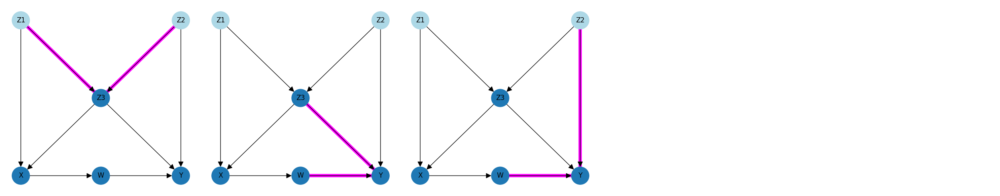

In [17]:
dag.draw_paths(paths=dag.v_structures()[::-1], cols=5)

In the first v-structure (Z1 -> Z3 <- Z2) we can intuitively see that Z1 and Z2 are completely independent. In our test (as opposed to real world examples) the data was generated using two independent distributions for Z1 and Z2 ...

$$
Z1 \sim \mathcal{N}(4.75, 1.72^2) \\
Z2 \sim \mathcal{N}(3.29, 1.88^2) \\ 
$$

... so we know there can be no dependencies and if this were a real world example and we believe we have correctly identified Z1 and Z2 as exogenous variables we would be confident that there could be no link.

However the other two are different because although there is no direct link between W and Z2 in the second v-structure or W and Z3 in the third (which would have made them adjacent) I am going to propose that they are still linked and that messages can still get through meaning that these v-structures cannot consistently be identified by carrying out dependency tests on the data.

Taking the second v-structure above (W -> Y <- Z2) there is no adjacency but there are backdoor paths between W and Z2 ...

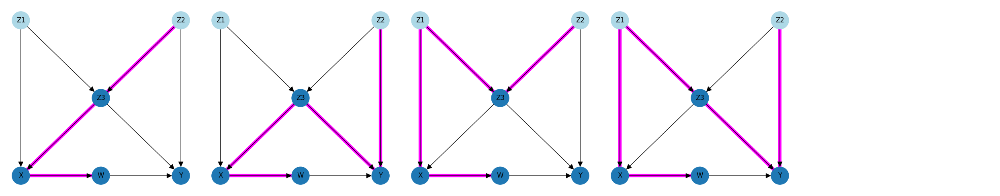

In [18]:
wyz_dag = DirectedAcyclicGraph(treatment="W", outcome="Z2", edges=dag.edges, pos=dag.pos)
wyz_dag.draw_paths(paths=wyz_dag.backdoor_paths()[::-1], cols=5)

Furthermore, of the 4 backdoor paths between W and Z2 one of them (the first one above W <- X <- Z3 <- Z2) is open (note that the definition of "open" is that the path does not contain a collider). The remaining paths all contain colliders at Y, Z3 and Y respectively and hence messages cannot pass but the first path is fully open and any change in W will cause a change in Z2.

To finish the exploration of non-adjacent links (or v-structures where messages can still pass) here is the set of back-door paths for the other v-structure (W -> Y <- Z3) ...

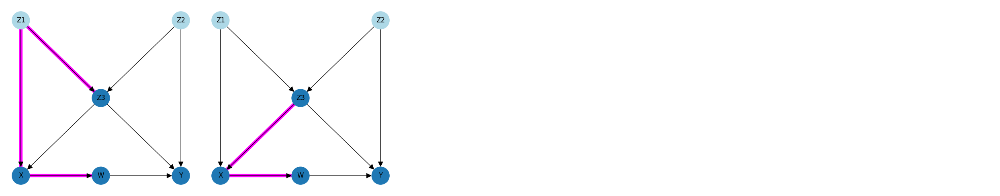

In [19]:
wyz_dag = DirectedAcyclicGraph(treatment="W", outcome="Z3", edges=dag.edges, pos=dag.pos)
wyz_dag.draw_paths(paths=wyz_dag.backdoor_paths(), cols=5)

This v-structure has two open backdoor paths so messages can certainly flow between W and Z3.

These issues led me to hypothesise that the claim cosistently made in the causal inference literarure i.e. that v-structures can be accurately identified in the data through dependency tests may not be correct in the case where an open backdoor path exists between the start and end nodes and this is certainly borne out by testing ...

In [20]:
data = causal_model.data

is_independent_on_unconditioned, _, ols_results = data.dependence(expression="W ⫫ Z2")
is_independent_on_unconditioned

False

Depnedency tests to identify v-structures in the data works where there are no open backdoor paths but if a link does exist this method will not work consistently.

When I first came to this realisation I was close to giving up on implementing the algorithm proposed in the previous section to identify reversed links in DAGs but I continued to work beyond the conclusions drawn in the literature to see if I could get an algortihm to work through trial-and-error.

## Strong and Weak V-Structures

The key thing that must work for validation of reversed links in the data is the detection of v-structures and the previous section has shown that this does not work consistently where a backdoor path exists between the start and end node.

This led me to the development of a new theory and some new terminology that I have not seen anywhere in the causal literature - the idea of strong and weak v-structures ...

A weak v-struture is a collider with no adjaceny (i.e. the start and end nodes are not directly linked)

A strong v-structure is a colider with no direct or indirect links other than the intermediary node

Using these definitions there are 3 weak v-structures in our example DAG, but only 1 strong v-structure and if the data matches the DAG it should be possible to identify that strong v-structure by carrying out a symmetrical dependency test ...

In [21]:
pd.set_option('display.float_format', '{:.6f}'.format)
pd.set_option('display.max_colwidth', 60)

In [22]:
ic.disable()

data = causal_model.data

df_junction = pd.DataFrame()
#column_names = ["junction", "junction_type", "start_⫫_end", "p_value_1", "coefficient_1", "end_⫫_start", "p_value_2", "coefficient_2", "v_structure_found"]

for junction in dag.junctions[::-1]:
    #collider_identified_in_data = causal_model._collider_identified_in_data(junction, dag)

    start = list(junction.keys())[0]
    intermediary = list(junction.keys())[1]
    end = list(junction.keys())[2]

    start_independent_of_end, _, ols_results_start_end = data.dependence(expression=f"{start} ⫫ {end}")
    end_independent_of_start, _, ols_results_end_start = data.dependence(expression=f"{end} ⫫ {start}")

    p_value_1 = ols_results_start_end.pvalues[end]
    coefficient_1 = ols_results_start_end.params[end]

    p_value_2 = ols_results_end_start.pvalues[start]
    coefficient_2 = ols_results_end_start.params[start]

    junction_row = pd.DataFrame([{'junction':str(junction), 'junction_type':dag.junction_type(junction, v_structures=True, strong_v_structures=True), \
                                 'start_⫫_end': start_independent_of_end, 'p_value_1': p_value_1, 'coefficient_1': coefficient_1, \
                                 'end_⫫_start': end_independent_of_start, 'p_value_2': p_value_2, 'coefficient_2': coefficient_2, \
                                 'v_structure_found': start_independent_of_end & end_independent_of_start
                                 }], index=[0])
    df_junction = pd.concat([df_junction, junction_row], ignore_index=True)

ic.enable()

df_junction

,junction,junction_type,start_⫫_end,p_value_1,coefficient_1,end_⫫_start,p_value_2,coefficient_2,v_structure_found
0,"{'Z1': 'treatment', 'Z3': 'collider', 'Z2': 'outcome'}",v-structure (strong),True,0.485291,-0.019285,True,0.485291,-0.025308,True
1,"{'Z1': 'treatment', 'X': 'collider', 'Z3': 'outcome'}",collider,True,0.000000,0.239960,False,0.000000,2.936007,False
2,"{'Z2': 'treatment', 'Y': 'collider', 'Z3': 'outcome'}",collider,True,0.000000,0.153272,False,0.000000,1.429051,False
3,"{'W': 'treatment', 'Y': 'collider', 'Z3': 'outcome'}",v-structure (weak),False,0.000000,8.845197,True,0.000000,0.098267,False
4,"{'W': 'treatment', 'Y': 'collider', 'Z2': 'outcome'}",v-structure (weak),False,0.000000,10.369908,True,0.000000,0.012356,False
5,"{'Y': 'treatment', 'Z2': 'fork', 'Z3': 'outcome'}",fork,False,0.000000,20.467502,True,0.000000,0.041428,False
6,"{'X': 'treatment', 'Z3': 'fork', 'Y': 'outcome'}",fork,True,0.000000,0.131137,False,0.000000,6.771502,False
7,"{'X': 'treatment', 'Z1': 'fork', 'Z3': 'outcome'}",fork,False,0.000000,2.979207,True,0.000000,0.311378,False
8,"{'Z2': 'treatment', 'Z3': 'chain', 'Y': 'outcome'}",chain,True,0.000000,0.005627,False,0.000000,25.920867,False
9,"{'Z2': 'treatment', 'Z3': 'chain', 'X': 'outcome'}",chain,True,0.000000,0.039697,False,0.000000,3.541190,False


The above test results reinforce the point. For each junction that exists in the DAG the junction type is identified from the DAG and then the remaining columns show the results of attempting to identify the junction type from the data.

The first junction to be analysed in the first rown of the test results is <b>Z1 -> Z3 <- Z2</b> ... 
- It is identified as a "v-structure (strong)" in the DAG because it is a collider with no adjacency and no indirect links.
- The dependency test <b>Z1 ⫫ Z2</b> (Z1 is independent of Z2) passes so start_⫫_end and the following p-value and coefficient show the results of the underlying dependency test that were evaluated to draw that conclusion. 
- The dependency test <b>Z2 ⫫ Z1</b> also passes and again the p-value and coefficident results are shown that provided that result.
- Lastly v_structure_found is True because both start_⫫_end and end_⫫_start were True.

The next 4 rows clearly show that the 2 colliders (which are adjacent) fail the v_structure_found test and the two weak v-structures (which are not adjacent but have indirect connections) also fail the test so the only junction that can be consistently identified through checks in the data (i.e. independently of the DAG) is the strong v_structure.

When I initially obtained these test results I thought I had cracked the problem and that I wuold be able to use my concept of strong v-structures to implement the basic algorithm for detecting the direction of causal links given above, but as usual in the quest to discover a causal validation algorithm the long road is littered with false dawns ,,,

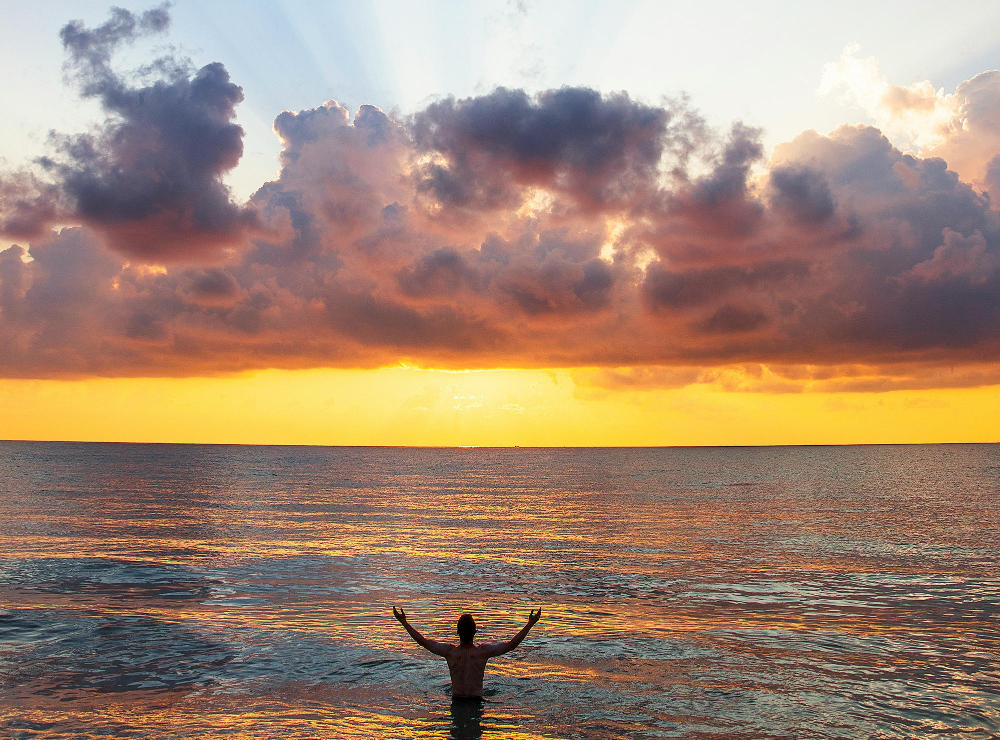
Photo by <a href="https://unsplash.com/@joshuaearle?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Joshua Earle</a> on <a href="https://unsplash.com/photos/man-raising-his-arms-on-sea-under-black-clouds-JAwzCW0JpIw?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Unsplash</a>

## The Problem with Strong V-Structures

To undrstand the fundamental flaw in using strong v-structures to implement the causal validation algorithm for strong links two different cases must be considered ...

1. The algorithm must be able to look at a dataset that perfectly matches a proposed DAG and find it valid.
2. The algorithm must also be able to look at a dataset that does not match a proposed DAG and find it invalid.

It turns out that strong v-structures are highly relaible at the first case, but poor at the second and that weak v-structures have inconsistent results from both.

The next stage is to look at some test results that prove the previous statement and then to continue the search for an algorithm that performs well enough to be usable in detecting reversed links.


## Understanding the Algorithm for Detecting Reversed Edges

Let's start by revewing the algorithm for identfying edges in the data that do not match the DAG edge direction (i.e. detecing edge reversal) ...

1. Iterate around all the edges in the DAG and for each edge ...
2. Create a new DAG by reversing the current edge.
3. If a v-structure has been created in the new DAG by reversing the edge and that v-structure exists in the data then the current DAG is wrong and the edge needs reversing.
4. If a v-structure has been destroyed in the current DAG and that v-structure does not exist in the data then the current DAG is wrong and the edge needs reversing.

Step 1 of the algorithm is going to iterate over all of the edges in the DAG which can be visualised as follows ...

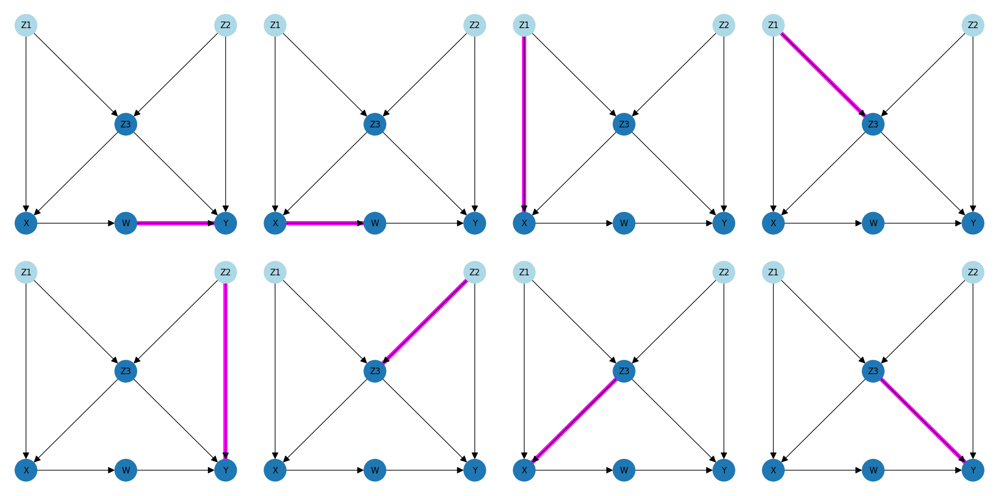

In [29]:
dag.draw_paths(dag.edges_to_paths(dag.edges), cols=4)

### Destroyed V-Structures

To illustrate and explain the algorithm to of the edges will be selected to work through steps 2 - 4 starting with the 4th edge between nodes Z1 and Z3 (Z1 -> Z3) ...

In [64]:
strong: bool = False

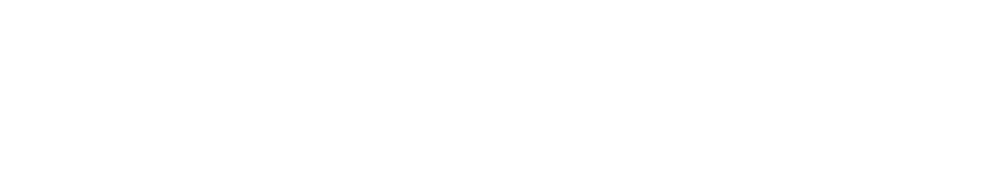

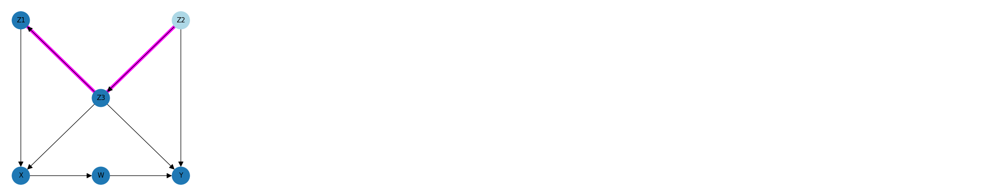

In [67]:
new_dag = dag.reverse_edges([('Z1', 'Z3')])

new_dag.draw_paths(dag.created_v_structures(new_dag=new_dag, strong=strong), cols=5)
plt.show()

new_dag.draw_paths(dag.destroyed_v_structures(new_dag=new_dag, strong=strong), cols=5)
plt.show()

By reversing the edge Z1 -> Z3 no new v-structures have been created but an existing v-structure has been destroyed i.e. Z1 -> Z3 <- Z2 no longer exists in the new DAG.

This is great news for step 3 in the algorithm because the existence of this v-structure in the data can be checked using dependency tests and if the dependency test cannot identify the v-structure Z1 -> Z3 <- Z2 it will indicate that the edge Z1 -> Z3 is incorrect in the DAG and needs reversing in order to correct it by matching the data.

Let's test this out ...

In [42]:
is_independent_of_unconditioned = data.dependence(expression="Z2 ⫫ Z1")[0] & data.dependence(expression="Z1 ⫫ Z2")[0]
is_dependent_on_conditioned = data.dependence(expression=f"Z2 ⫫̸ Z1 | Z3")[0] & data.dependence(expression="Z1 ⫫̸ Z2 | Z3")[0]

is_independent_of_unconditioned & is_dependent_on_conditioned

ic| expression: 'Z2 ⫫ Z1'
ic| expression: 'Z1 ⫫ Z2'
ic| expression: 'Z2 ⫫̸ Z1 | Z3'
ic| expression: 'Z1 ⫫̸ Z2 | Z3'


True

The code above is using the depenency extension method of the ``DataFrame`` class to test the following ...

1. Z2 is independent of Z1
2. Z1 is independent of Z2
3. Z2 is dependent on Z1 when conditioned on Z3
4. Z1 is dependent on Z2 when conditioned on Z3

... and we can see that these tests all return ``True`` which shows that the v-structure Z1 -> Z3 <- Z2 can be detected in the data and hence accepting the proposed reversal would be invalid and incorrect..

To summarise these steps have visualised what happens at steps 2 and 3 in the algorithm where each edge is reversed in turn, any destroyed v-structures identified and then a dependency test used to either validate (i.e. accept or reject) that proposed reversal.

### Created V-Structures

To illustrate step 4 of the algorithm, the 2nd edge (X -> W) has been selected (recalling that in the full implementation every edge would be tested in turn)

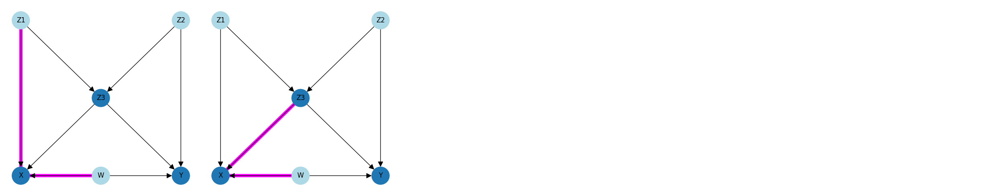

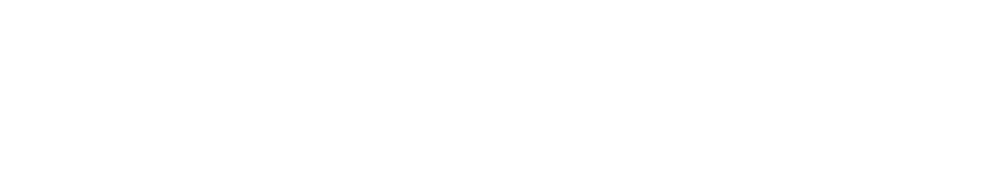

In [69]:
new_dag = dag.reverse_edges([('X', 'W')])

new_dag.draw_paths(dag.created_v_structures(new_dag=new_dag, strong=strong), cols=5)
plt.show()

new_dag.draw_paths(dag.destroyed_v_structures(new_dag=new_dag, strong=strong), cols=5)
plt.show()

By reversing the edge X -> W no existing v-structures have been destroyed but 2 new edge structures have been created - Z1 -> Z <- W and Z3 -> X <- W which is great news for testing step 3 of the algorithm because if either of these v-structures can be detected in the data then the current DAG is wrong and the edge X -> W needs reversing for the DAG to accurately represent the data.

Here is the code to check the data using dependency tests ...

In [72]:
is_independent_of_unconditioned = data.dependence(expression="W ⫫ Z1")[0] & data.dependence(expression="Z1 ⫫ W")[0]
is_dependent_on_conditioned = data.dependence(expression=f"W ⫫̸ Z1 | X")[0] & data.dependence(expression="Z1 ⫫̸ W | X")[0]

is_independent_of_unconditioned & is_dependent_on_conditioned

False

In [71]:
is_independent_of_unconditioned = data.dependence(expression="W ⫫ Z3")[0] & data.dependence(expression="Z3 ⫫ W")[0]
is_dependent_on_conditioned = data.dependence(expression=f"W ⫫̸ Z3 | X")[0] & data.dependence(expression="Z3 ⫫̸ W | X")[0]

is_independent_of_unconditioned & is_dependent_on_conditioned

False

The dependency tests both return False indicating that the proposed v-structures Z1 -> Z <- W and Z3 -> X <- W do not exist in the data.

Therefore edge X -> W should not be reversed in the DAG as it correctly represents the directionality of the relationship that is detected in the Data.

In [75]:
ic.enable()
ic("created v structures")
new_dag = dag.reverse_edges([('X', 'W')])

for created_v_structure in dag.created_v_structures(new_dag=new_dag, strong=False):
    ic(new_dag.junction_type(created_v_structure, True, True), created_v_structure)
    #print(created_v_structure)


ic("destroyed v structures")
new_dag = dag.reverse_edges([('Z1', 'Z3')])

for destroyed_v_structure in dag.destroyed_v_structures(new_dag=new_dag, strong=False):
    ic(new_dag.junction_type(destroyed_v_structure, True, True), destroyed_v_structure)


ic| 'created v structures'
ic| new_dag.junction_type(created_v_structure, True, True): 'v-structure (strong)'
    created_v_structure: {'W': 'treatment', 'X': 'collider', 'Z1': 'outcome'}
ic| new_dag.junction_type(created_v_structure, True, True): 'v-structure (strong)'
    created_v_structure: {'W': 'treatment', 'X': 'collider', 'Z3': 'outcome'}
ic| 'destroyed v structures'
ic| new_dag.junction_type(destroyed_v_structure, True, True): 'v-structure (weak)'
    destroyed_v_structure: {'Z1': 'treatment', 'Z2': 'outcome', 'Z3': 'collider'}


In [25]:
#ic.disable()
is_valid, reversed_edges = causal_model._pearlean_validate_reversed_edges(strong_v_structures=True, override_reversed_edges = [])
print(is_valid)
print(reversed_edges)
#ic.enable()

ic| edge: ('X', 'W')
    created_v_structure: {'W': 'treatment', 'Y': 'collider', 'Z2': 'outcome'}
ic| expression: 'Z2 ⫫ W'
ic| expression: 'W ⫫ Z2'
ic| expression: 'Z2 ⫫̸ W | Y'
ic| expression: 'W ⫫̸ Z2 | Y'
ic| edge: ('X', 'W')
    created_v_structure: {'W': 'treatment', 'Y': 'collider', 'Z3': 'outcome'}
ic| expression: 'Z3 ⫫ W'
ic| expression: 'W ⫫ Z3'
ic| expression: 'Z3 ⫫̸ W | Y'
ic| expression: 'W ⫫̸ Z3 | Y'
ic| edge: ('X', 'W')
    created_v_structure: {'W': 'treatment', 'X': 'collider', 'Z1': 'outcome'}
ic| expression: 'Z1 ⫫ W'
ic| expression: 'W ⫫ Z1'
ic| expression: 'Z1 ⫫̸ W | X'
ic| expression: 'W ⫫̸ Z1 | X'
ic| edge: ('X', 'W')
    created_v_structure: {'W': 'treatment', 'X': 'collider', 'Z3': 'outcome'}
ic| expression: 'Z3 ⫫ W'
ic| expression: 'W ⫫ Z3'
ic| expression: 'Z3 ⫫̸ W | X'
ic| expression: 'W ⫫̸ Z3 | X'
ic| edge: ('Z1', 'Z3')
    destroyed_v_structures: {'Z1': 'treatment', 'Z2': 'outcome', 'Z3': 'collider'}
ic| expression: 'Z2 ⫫ Z1'
ic| expression: 'Z1 ⫫ Z2'
ic| ex

True
[]


In [26]:
ic.disable()
is_valid, reversed_edges = causal_model._pearlean_validate_reversed_edges(strong_v_structures=False, override_reversed_edges = [])
print(is_valid)
print(reversed_edges)
ic.enable()

False
[('W', 'Y')]
